In [1]:
library(Seurat)
library(dplyr)
library(ggplot2)
library(harmony)

Loading required package: SeuratObject

Loading required package: sp

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, saveRDS


Loading Seurat v5 beta version 
To maintain compatibility with previous workflows, new Seurat objects will use the previous object structure by default
To use new Seurat v5 assays: Please run: options(Seurat.object.assay.version = 'v5')


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


# Import Data

In [2]:
mtx_3055 <- Read10X(data.dir = 'h5_files/3055/')
so_3055 <- CreateSeuratObject(mtx_3055$`Gene Expression`, project = 'MIS-C Severe')
so_3055$sampleID <- '3055'

10X data contains more than one type and is being returned as a list containing matrices of each type.



In [3]:
mtx_3056 <- Read10X(data.dir = 'h5_files/3056/')
so_3056 <- CreateSeuratObject(mtx_3056$`Gene Expression`, project = 'MIS-C Severe')
so_3056$sampleID <- '3056'

10X data contains more than one type and is being returned as a list containing matrices of each type.



In [4]:
mtx_3057 <- Read10X(data.dir = 'h5_files/3057/')
so_3057 <- CreateSeuratObject(mtx_3057, project = 'MIS-C Severe')
so_3057$sampleID <- '3057'

In [5]:
mtx_3058 <- Read10X(data.dir = 'h5_files/3058/')
so_3058 <- CreateSeuratObject(mtx_3058, project = 'MIS-C Moderate')
so_3058$sampleID <- '3058'

In [6]:
mtx_3059 <- Read10X(data.dir = 'h5_files/3059/')
so_3059 <- CreateSeuratObject(mtx_3059, project = 'MIS-C Moderate')
so_3059$sampleID <- '3059'

In [7]:
mtx_3060 <- Read10X(data.dir = 'h5_files/3060/')
so_3060 <- CreateSeuratObject(mtx_3060, project = 'MIS-C Severe')
so_3060$sampleID <- '3060'

In [8]:
mtx_3061 <- Read10X(data.dir = 'h5_files/3061/')
so_3061 <- CreateSeuratObject(mtx_3061, project = 'MIS-C Severe')
so_3061$sampleID <- '3061'

In [9]:
mtx_3062 <- Read10X(data.dir = 'h5_files/3062/')
so_3062 <- CreateSeuratObject(mtx_3062, project = 'MIS-C Severe/Recovered')
so_3062$sampleID <- '3062'

In [10]:
mtx_3063 <- Read10X(data.dir = 'h5_files/3063/')
so_3063 <- CreateSeuratObject(mtx_3063, project = 'MIS-C Moderate/Recovered')
so_3063$sampleID <- '3063'

In [11]:
mtx_3064 <- Read10X(data.dir = 'h5_files/3064/')
so_3064 <- CreateSeuratObject(mtx_3064, project = 'Healthy')
so_3064$sampleID <- '3064'

In [12]:
mtx_3065 <- Read10X(data.dir = 'h5_files/3065/')
so_3065 <- CreateSeuratObject(mtx_3065, project = 'Healthy')
so_3065$sampleID <- '3065'

In [13]:
mtx_3066 <- Read10X(data.dir = 'h5_files/3066/')
so_3066 <- CreateSeuratObject(mtx_3066, project = 'Healthy')
so_3066$sampleID <- '3066'

In [14]:
mtx_3067 <- Read10X(data.dir = 'h5_files/3067/')
so_3067 <- CreateSeuratObject(mtx_3067, project = 'Healthy')
so_3067$sampleID <- '3067'

In [15]:
mtx_3068 <- Read10X(data.dir = 'h5_files/3068/')
so_3068 <- CreateSeuratObject(mtx_3068, project = 'Healthy')
so_3068$sampleID <- '3068'

In [16]:
mtx_3069 <- Read10X(data.dir = 'h5_files/3069/')
so_3069 <- CreateSeuratObject(mtx_3069, project = 'Healthy')
so_3069$sampleID <- '3069'

# Merge Data

In [17]:
so_merge <- merge(x = so_3055, y = c(so_3056,so_3057,so_3058,so_3059,so_3060,so_3061,so_3062,so_3063,so_3064,so_3065,so_3066,so_3067,so_3068,so_3069))

Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


In [18]:
table(so_merge$orig.ident)


                 Healthy           MIS-C Moderate MIS-C Moderate/Recovered 
                   60107                    21160                    10625 
            MIS-C Severe   MIS-C Severe/Recovered 
                   33608                    10144 

In [19]:
table(so_merge$sampleID)


 3055  3056  3057  3058  3059  3060  3061  3062  3063  3064  3065  3066  3067 
 9375  5610  3034  8786 12374 10807  4782 10144 10625  9665  7776 10624 10994 
 3068  3069 
11413  9635 

In [20]:
so_merge

An object of class Seurat 
33538 features across 135644 samples within 1 assay 
Active assay: RNA (33538 features, 0 variable features)

In [21]:
so_merge[["percent.mt"]] <- PercentageFeatureSet(so_merge, 
                                                           pattern = "^MT-")
so_merge <- subset(so_merge, subset = nFeature_RNA > 200 & percent.mt < 10) 

In [22]:
so_merge

An object of class Seurat 
33538 features across 131932 samples within 1 assay 
Active assay: RNA (33538 features, 0 variable features)

# Integrated Analysis

In [23]:
# split the dataset into a list of two seurat objects (stim and CTRL)
stim.list <- SplitObject(so_merge, split.by = "sampleID")

# normalize and identify variable features for each dataset independently
stim.list <- lapply(X = stim.list, FUN = function(x) {
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
})

# select features that are repeatedly variable across datasets for integration
features <- SelectIntegrationFeatures(object.list = stim.list)

In [24]:
immune.anchors <- FindIntegrationAnchors(object.list = stim.list, anchor.features = features)

Scaling features for provided objects

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 11784 anchors

Filtering anchors

	Retained 6513 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 8926 anchors

Filtering anchors

	Retained 5551 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 8078 anchors

Filtering anchors

	Retained 5601 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 14822 anchors

Filtering anchors

	Retained 4661 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 13136 anchors

Filtering anchors

	Retained 4967 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 8858 anchors

Filtering anchors

	Retained 4130 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 18935 anchors

Filtering anchors

	Retained 347

In [25]:
# this command creates an 'integrated' data assay
immune.combined <- IntegrateData(anchorset = immune.anchors)

Merging dataset 3 into 2

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 7 into 6

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 2 3 into 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 10 into 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 11 into 9

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 13 into 14

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 into 5 10

Extracting anchors for merged samples

Finding integration vectors

Finding i

In [26]:
# specify that we will perform downstream analysis on the corrected data note that the
# original unmodified data still resides in the 'RNA' assay
DefaultAssay(immune.combined) <- "integrated"

# Run the standard workflow for visualization and clustering
immune.combined <- ScaleData(immune.combined, verbose = FALSE)
immune.combined <- RunPCA(immune.combined, npcs = 30, verbose = FALSE)
immune.combined <- RunUMAP(immune.combined, reduction = "pca", dims = 1:25)
immune.combined <- FindNeighbors(immune.combined, reduction = "pca", dims = 1:25)
immune.combined <- FindClusters(immune.combined, resolution = 1)

06:47:12 Commencing optimization for 200 epochs, with 6515080 positive edges

06:48:41 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 131932
Number of edges: 5085730

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9014
Number of communities: 34
Elapsed time: 124 seconds


4 singletons identified. 30 final clusters.



Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



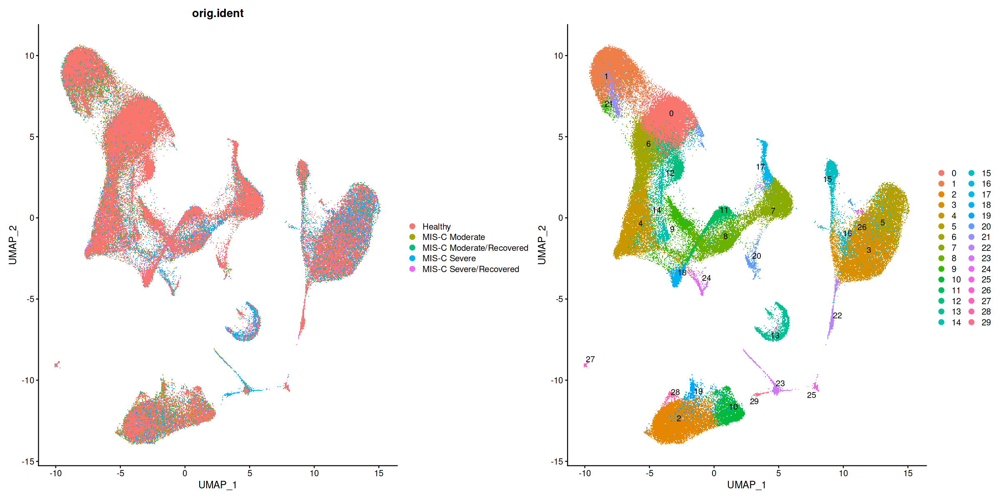

In [27]:
# Visualization
options(repr.plot.width = 20, repr.plot.height = 10)
p1 <- DimPlot(immune.combined, reduction = "umap", group.by = "orig.ident")
p2 <- DimPlot(immune.combined, reduction = "umap", label = TRUE, repel = TRUE)
p1 + p2

In [28]:
DefaultAssay(immune.combined) <- 'RNA'
immune.combined <- NormalizeData(immune.combined)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



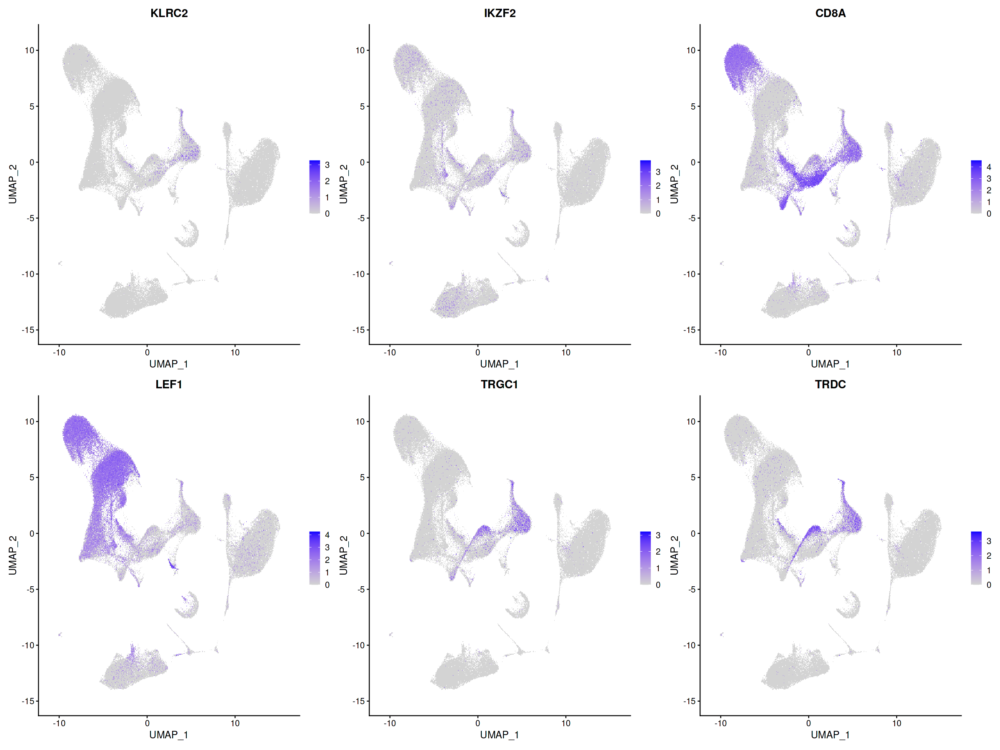

In [32]:
options(repr.plot.width = 20, repr.plot.height = 15)
FeaturePlot(immune.combined, features = c('KLRC2','IKZF2','CD8A','LEF1','TRGC1','TRDC'), order = TRUE, ncol = 3)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



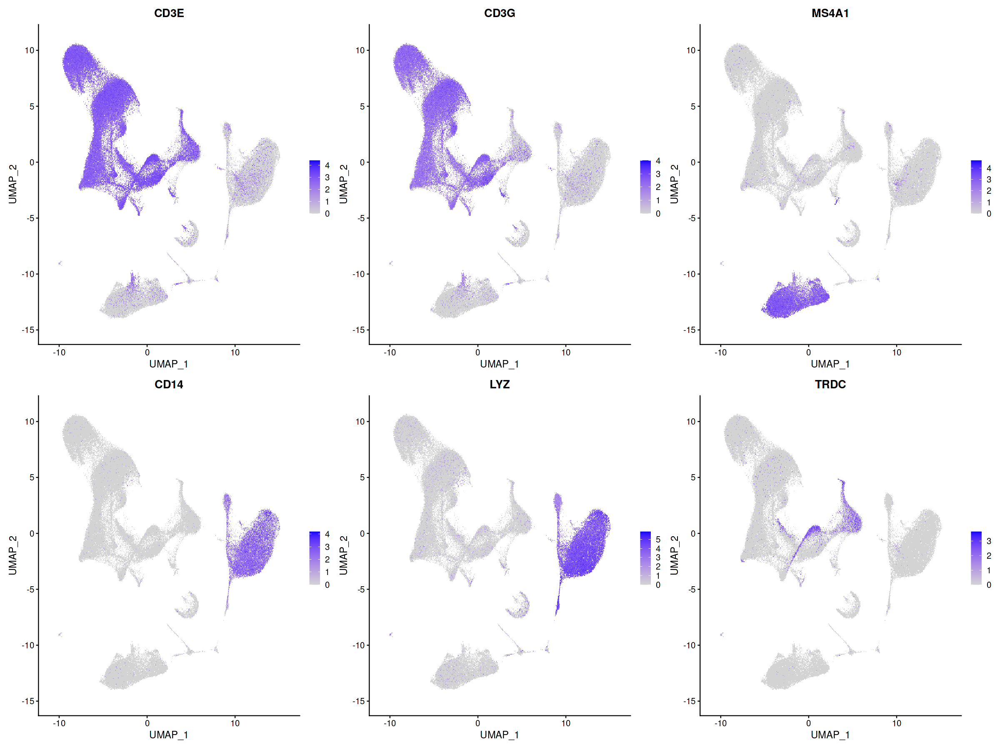

In [36]:
options(repr.plot.width = 20, repr.plot.height = 15)
FeaturePlot(immune.combined, features = c('CD3E','CD3G','MS4A1','CD14','LYZ','TRDC'), order = TRUE, ncol = 3)

In [30]:
degs <- FindAllMarkers(immune.combined, max.cells.per.ident = 500)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23

Calculating cluster 24

Calculating cluster 25

Calculating cluster 26

Calculating cluster 27

Calculating cluster 28

Calculating cluster 29



In [35]:
subset(degs, gene %in% c('IKZF2','KLRC2','KLRC3','TRGC1','CD8A','TRGC2') & avg_log2FC > 0)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
CD8A.1,1.258982e-83,1.4661530,0.773,0.112,4.222374e-79,1,CD8A
TRGC1,1.229934e-19,0.7028094,0.166,0.016,4.124953e-15,7,TRGC1
KLRC3,1.029790e-17,0.6039053,0.131,0.010,3.453710e-13,7,KLRC3
CD8A.7,1.306305e-06,0.7294096,0.331,0.176,4.381086e-02,7,CD8A
CD8A.8,3.775511e-93,2.5315935,0.787,0.162,1.266231e-88,8,CD8A
TRGC2,5.718264e-12,0.4222944,0.113,0.012,1.917791e-07,8,TRGC2
CD8A.9,3.281421e-25,1.0888743,0.479,0.175,1.100523e-20,9,CD8A
TRGC1.1,2.369000e-28,0.8005413,0.238,0.020,7.945153e-24,11,TRGC1
TRGC2.1,1.293715e-10,0.4404710,0.118,0.014,4.338862e-06,11,TRGC2


In [31]:
saveRDS(immune.combined, file = 'integration_take2.rds')

## Cell Label Transfer

In [2]:
immune.combined <- readRDS(file = 'integration_take2.rds')

In [3]:
library(SeuratDisk)
reference <- LoadH5Seurat("/home/jupyter/pbmc_multimodal.h5seurat")

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat

Validating h5Seurat file

Initializing ADT with data

Adding counts for ADT

Adding variable feature information for ADT

Adding miscellaneous information for ADT

Initializing SCT with data

Adding counts for SCT

Adding variable feature information for SCT

Adding miscellaneous information for SCT

Adding reduction apca

Adding cell embeddings for apca

Adding feature loadings for apca

Adding miscellaneous information for apca

Adding reduction aumap

Adding cell embeddings for aumap

Adding miscellaneous information for aumap

Adding reduction pca

Adding cell embeddings for pca

Adding feature loadings for pca

Adding miscellaneous information for pca

Adding reduction spca

Adding cell embeddings for spca

Adding feature loadings for spca

Adding miscellaneous information for spca

Adding reduction umap

Adding cell embeddings for umap

Adding miscellaneous information for uma

In [4]:
anchors <- FindTransferAnchors(
  reference = reference,
  query = immune.combined,
  normalization.method = "SCT",
  reference.reduction = "spca",
  dims = 1:50
)
immune.combined <- TransferData(
  anchorset = anchors, 
  reference = reference,
  query = immune.combined,
  refdata = list(
    celltype.l1 = "celltype.l1",
    celltype.l2 = "celltype.l2",
    celltype.l3 = "celltype.l3",  
    predicted_ADT = "ADT")
)

Normalizing query using reference SCT model

Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 34771 anchors

Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l1_ to predictionscorecelltypel1_”
Predicting cell labels

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l2_ to predictionscorecelltypel2_”
Predicting cell labels

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l3_ to predictionscorecelltypel3_”
Transfering 228 features ont

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



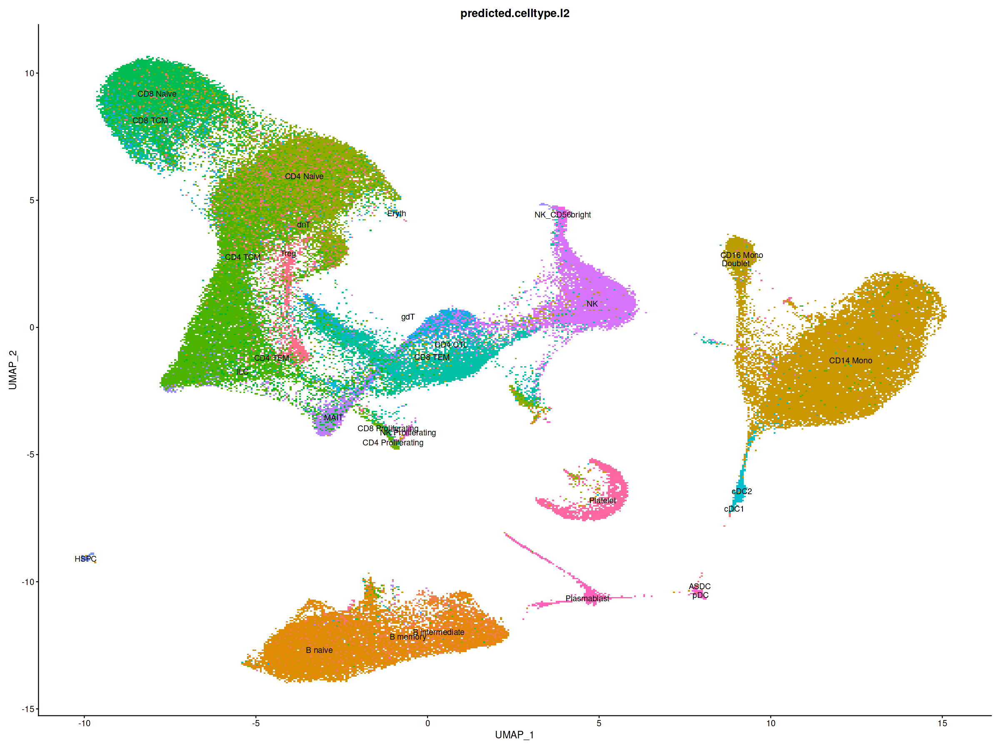

In [5]:
options(repr.plot.width = 20, repr.plot.height = 15)
DimPlot(immune.combined, group.by = 'predicted.celltype.l2', label = TRUE) & NoLegend()

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



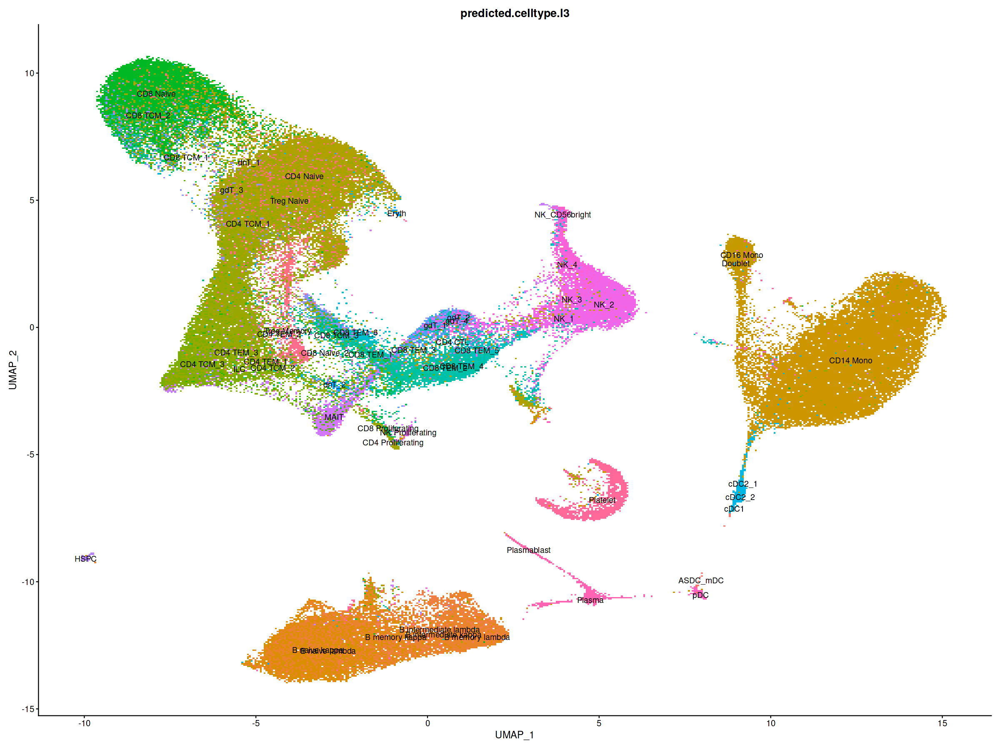

In [6]:
options(repr.plot.width = 20, repr.plot.height = 15)
DimPlot(immune.combined, group.by = 'predicted.celltype.l3', label = TRUE) & NoLegend()

## T Cell Subset

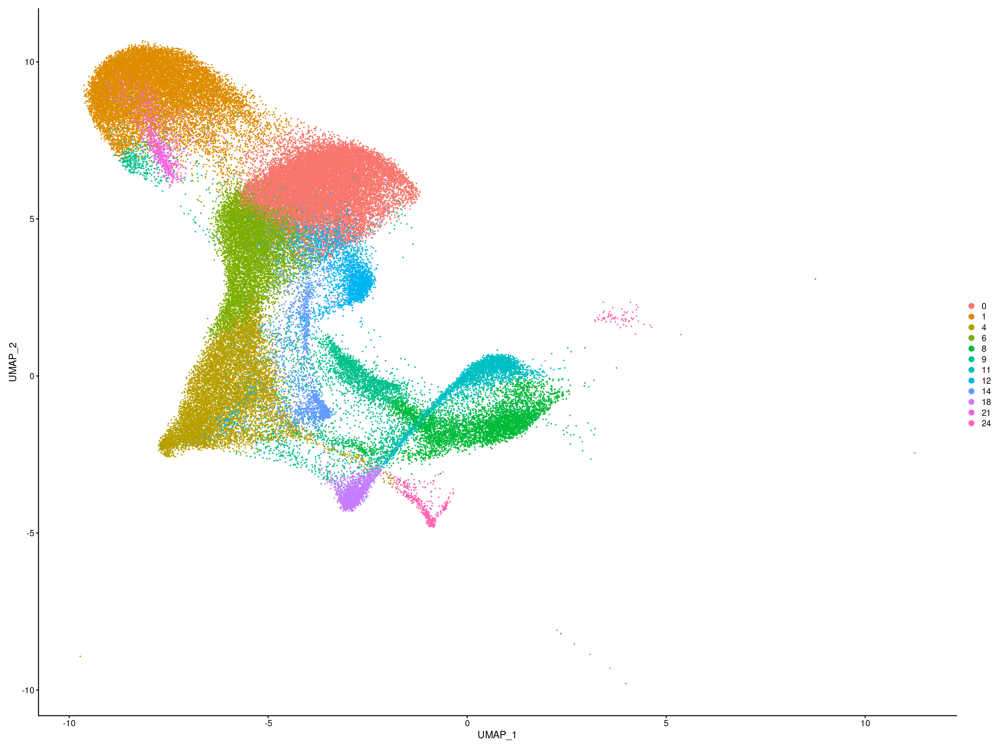

In [7]:
t_cells <- subset(immune.combined, idents = c(0,1,21,6,12,14,4,9,18,24,8,11))
DimPlot(t_cells)

In [8]:
DefaultAssay(t_cells) <- "integrated"

# Run the standard workflow for visualization and clustering
t_cells <- ScaleData(t_cells, verbose = FALSE)
t_cells <- RunPCA(t_cells, npcs = 30, verbose = FALSE)
t_cells <- RunUMAP(t_cells, reduction = "pca", dims = 1:25)
t_cells <- FindNeighbors(t_cells, reduction = "pca", dims = 1:25)
t_cells <- FindClusters(t_cells, resolution = 1)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
16:50:34 UMAP embedding parameters a = 0.9922 b = 1.112

16:50:34 Read 72372 rows and found 25 numeric columns

16:50:34 Using Annoy for neighbor search, n_neighbors = 30

16:50:34 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:50:46 Writing NN index file to temp file /tmp/Rtmpgm5rOW/file163df1a8debf7

16:50:46 Searching Annoy index using 1 thread, search_k = 3000

16:51:27 Annoy recall = 100%

16:51:27 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 72372
Number of edges: 2445079

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8517
Number of communities: 24
Elapsed time: 45 seconds


1 singletons identified. 23 final clusters.



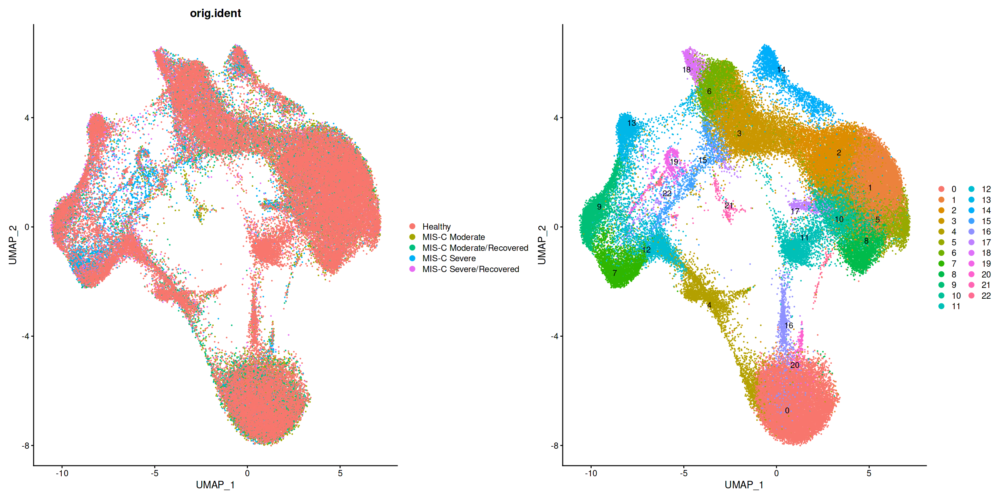

In [9]:
options(repr.plot.width = 20, repr.plot.height = 10)
p1 <- DimPlot(t_cells, reduction = "umap", group.by = "orig.ident")
p2 <- DimPlot(t_cells, reduction = "umap", label = TRUE, repel = TRUE)
p1 + p2

Warning message:
“ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


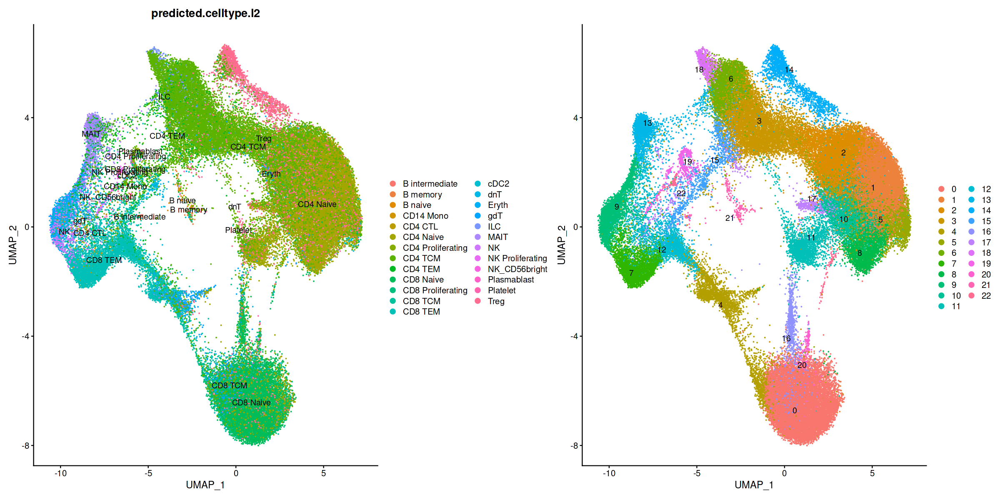

In [10]:
options(repr.plot.width = 20, repr.plot.height = 10)
p1 <- DimPlot(t_cells, reduction = "umap", group.by = "predicted.celltype.l2", label = TRUE)
p2 <- DimPlot(t_cells, reduction = "umap", label = TRUE, repel = TRUE)
p1 + p2

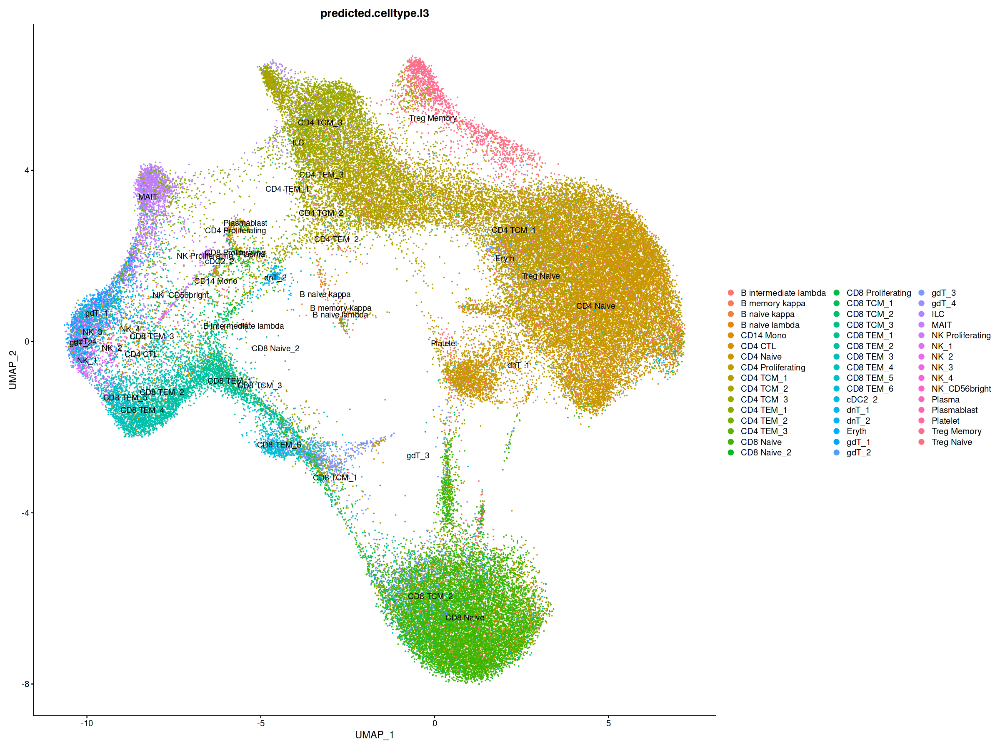

In [11]:
options(repr.plot.width = 20, repr.plot.height = 15)
DimPlot(t_cells, reduction = "umap", group.by = "predicted.celltype.l3", label = TRUE)

In [12]:
degs_t_cells <- FindAllMarkers(t_cells, max.cells.per.ident = 500, assay = 'RNA')

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22



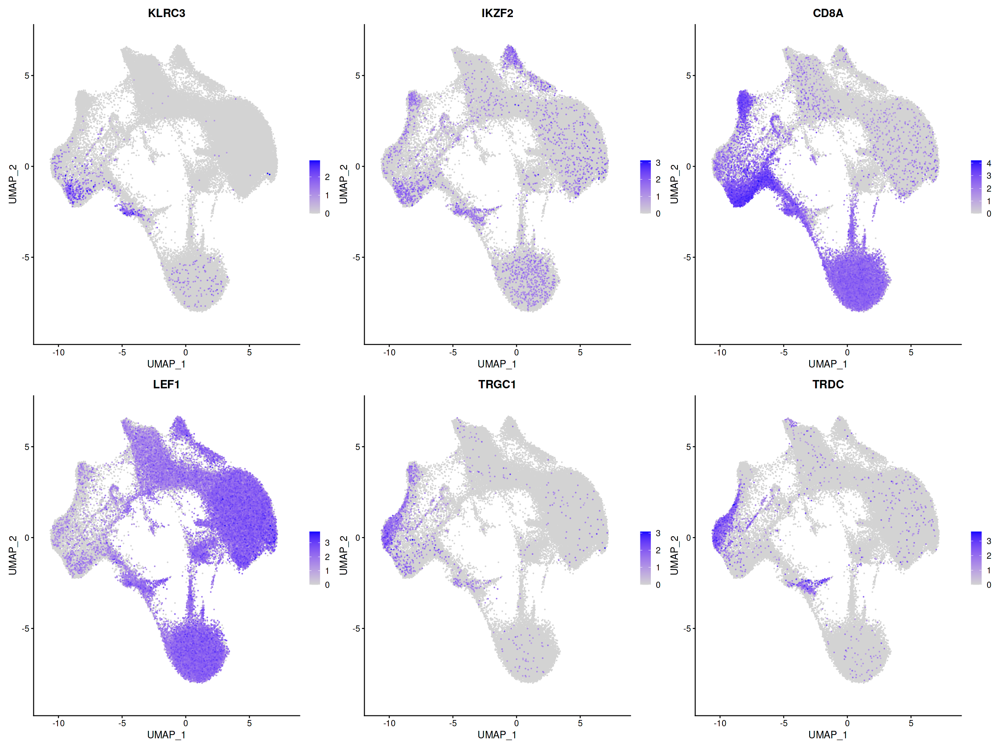

In [13]:
options(repr.plot.width = 20, repr.plot.height = 15)
DefaultAssay(t_cells) <- 'RNA'
FeaturePlot(t_cells, features = c('KLRC3','IKZF2','CD8A','LEF1','TRGC1','TRDC'), order = TRUE, ncol = 3)

In [14]:
t_cells <- FindSubCluster(t_cells, cluster = 4, resolution = 0.3, graph.name = 'integrated_snn', subcluster.name = 'sub.cluster')

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3167
Number of edges: 106632

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8253
Number of communities: 4
Elapsed time: 0 seconds


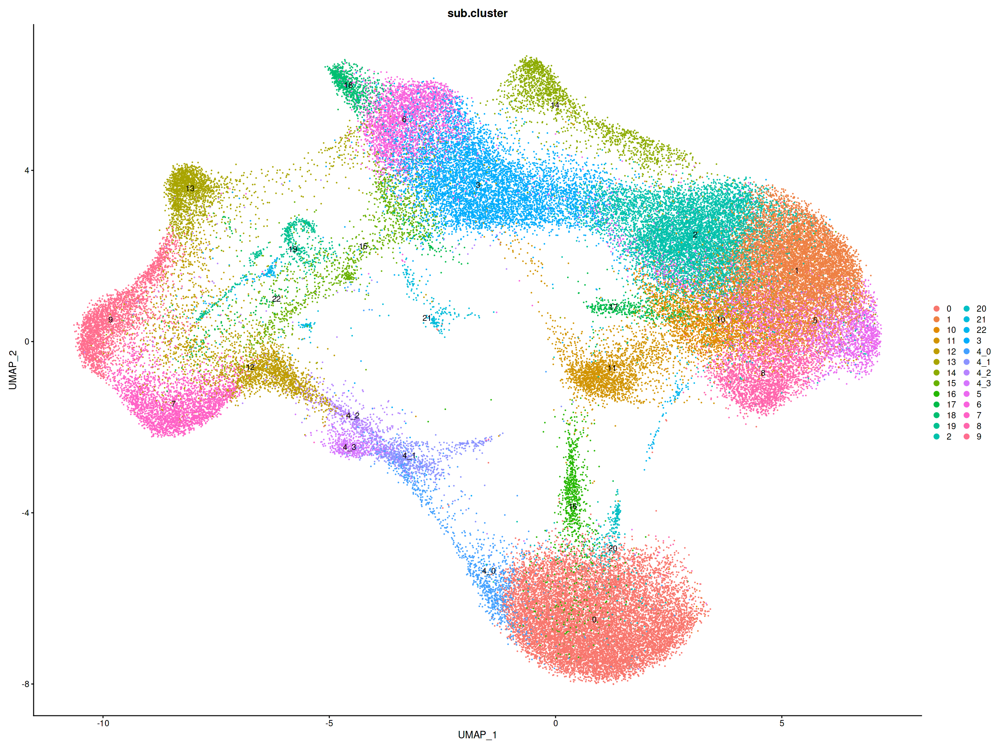

In [15]:
options(repr.plot.width = 20, repr.plot.height = 15)
DimPlot(t_cells, reduction = "umap", group.by = "sub.cluster", label = TRUE)

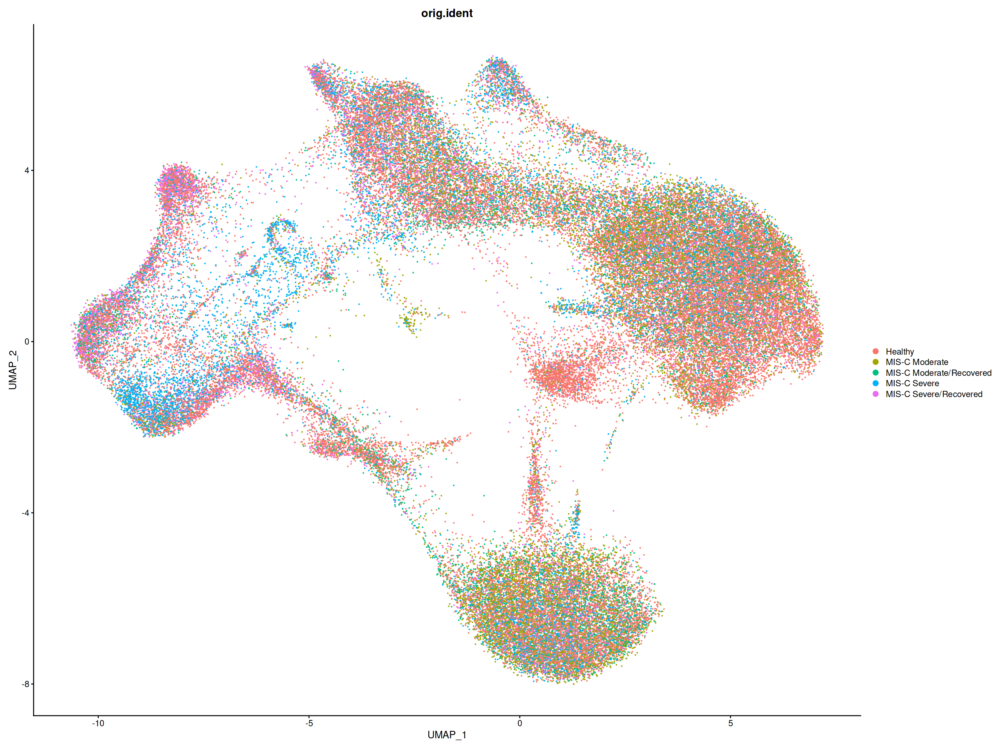

In [16]:
options(repr.plot.width = 20, repr.plot.height = 15)
DimPlot(t_cells, reduction = "umap", group.by = "orig.ident", shuffle = TRUE)

In [17]:
c4_3_markers <- FindMarkers(t_cells, `ident.1` = '4_3', assay = 'RNA', group.by = 'sub.cluster')

In [18]:
c4_1_markers <- FindMarkers(t_cells, `ident.1` = '4_1', assay = 'RNA', group.by = 'sub.cluster')
c4_2_markers <- FindMarkers(t_cells, `ident.1` = '4_2', assay = 'RNA', group.by = 'sub.cluster')

In [19]:
head(c4_3_markers, n=20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ZNF683,0.000000e+00,2.0728731,0.473,0.023,0.000000e+00
XCL1,0.000000e+00,1.4910553,0.260,0.006,0.000000e+00
KLRC3,0.000000e+00,1.0710433,0.263,0.009,0.000000e+00
KIR3DL2,7.211753e-302,1.0929779,0.221,0.013,2.418678e-297
LMNA,2.434058e-214,2.3312994,0.477,0.082,8.163345e-210
NCR3,2.724394e-203,1.3188579,0.420,0.067,9.137073e-199
DUSP2,4.727359e-179,1.8820043,0.899,0.394,1.585462e-174
CXCR3,9.050426e-179,1.4485563,0.501,0.103,3.035332e-174
XCL2,7.771906e-172,0.9620522,0.168,0.013,2.606542e-167


In [20]:
head(c4_1_markers, n=20)
head(c4_2_markers, n=20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MME,0.000000e+00,0.6568503,0.113,0.001,0.000000e+00
RTKN2,0.000000e+00,1.3293839,0.411,0.025,0.000000e+00
TRDV1,0.000000e+00,2.0518289,0.385,0.014,0.000000e+00
TRDC,0.000000e+00,1.4209838,0.319,0.027,0.000000e+00
DKK3,8.595484e-256,0.5419242,0.144,0.010,2.882753e-251
TRGV2,2.256242e-199,0.6192405,0.163,0.017,7.566986e-195
TRGV8,2.732326e-164,0.5155472,0.109,0.009,9.163675e-160
KIR3DL2,9.442949e-160,0.5635070,0.130,0.013,3.166976e-155
TRGV4,3.400245e-134,0.5330901,0.116,0.012,1.140374e-129


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CCL5,0.000000e+00,1.4884590,0.873,0.203,0.000000e+00
GZMK,3.643539e-237,1.4791260,0.494,0.107,1.221970e-232
LYAR,4.531167e-195,1.1815118,0.640,0.203,1.519663e-190
CD8A,2.742403e-157,1.1021199,0.711,0.275,9.197471e-153
GABARAPL1,3.322252e-132,1.1100660,0.539,0.194,1.114217e-127
NR4A2,8.976742e-110,1.0899449,0.621,0.277,3.010620e-105
CXCR3,2.502487e-109,0.8869344,0.356,0.103,8.392842e-105
DUSP2,2.387954e-104,0.9967894,0.748,0.393,8.008721e-100
ZFP36,1.144456e-97,1.0492039,0.936,0.736,3.838277e-93


## MNP-2

In [21]:
t_cells <- SetIdent(t_cells, value = 'sub.cluster')
mnp2 <- subset(t_cells, idents = '4_3')

In [22]:
table(mnp2$orig.ident)


                 Healthy           MIS-C Moderate MIS-C Moderate/Recovered 
                     316                       19                       57 
            MIS-C Severe   MIS-C Severe/Recovered 
                       5                       60 

In [23]:
table(t_cells$orig.ident)


                 Healthy           MIS-C Moderate MIS-C Moderate/Recovered 
                   36119                    12124                     6440 
            MIS-C Severe   MIS-C Severe/Recovered 
                   11378                     6311 

In [34]:
mnp2
t_cells

An object of class Seurat 
35863 features across 457 samples within 6 assays 
Active assay: RNA (33538 features, 0 variable features)
 5 other assays present: integrated, prediction.score.celltype.l1, prediction.score.celltype.l2, prediction.score.celltype.l3, predicted_ADT
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
35863 features across 72372 samples within 6 assays 
Active assay: RNA (33538 features, 0 variable features)
 5 other assays present: integrated, prediction.score.celltype.l1, prediction.score.celltype.l2, prediction.score.celltype.l3, predicted_ADT
 2 dimensional reductions calculated: pca, umap

In [24]:
316/58127*100
19/20581*100
57/10394*100
5/32763*100
60/10067*100

[1] 0.5436372

[1] 0.09231816

[1] 0.5483933

[1] 0.01526112

[1] 0.5960068

In [8]:
perc_mnp2 <- data.frame(mnp2_perc = c(316/36119*100,
                                      19/12124*100,
                                      57/6440*100,
                                      5/11378*100,
                                      60/6311*100),
                        condition = c('Healthy','MIS-C Moderate','MIS-C Moderate/Recovered','MIS-C Severe','MIS-C Severe/Recovered'))

In [9]:
perc_mnp2

mnp2_perc,condition
<dbl>,<chr>
0.87488579,Healthy
0.15671396,MIS-C Moderate
0.88509317,MIS-C Moderate/Recovered
0.04394445,MIS-C Severe
0.95072096,MIS-C Severe/Recovered


# Ext Fig 10I

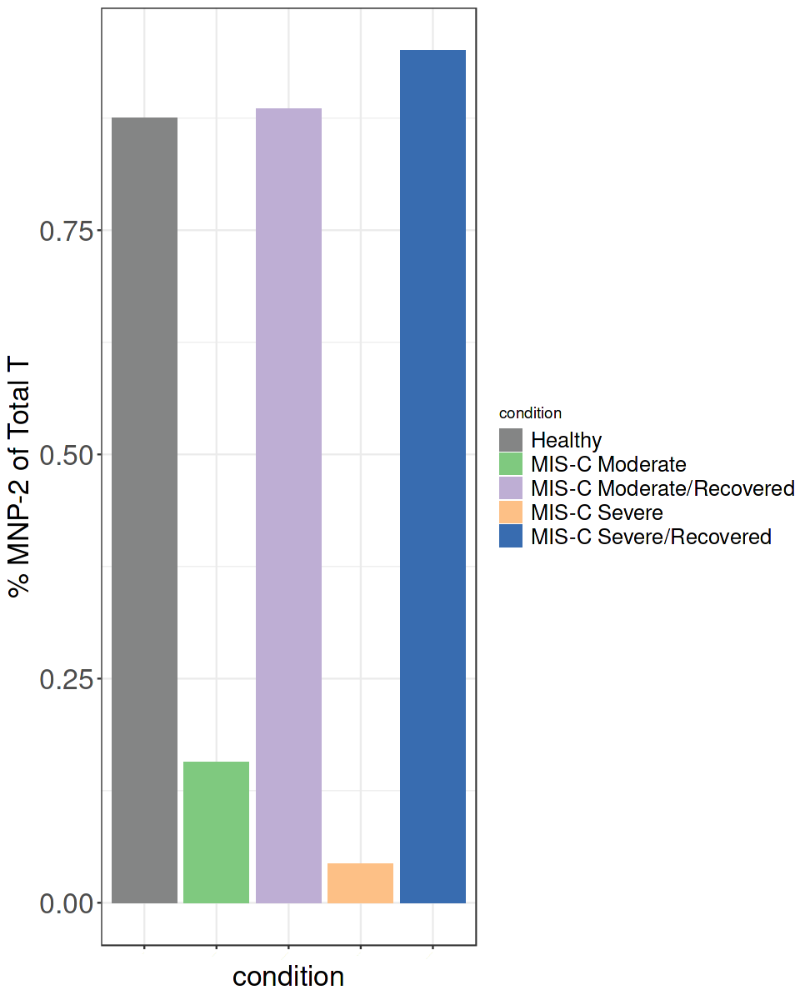

In [18]:
options(repr.plot.width = 8, repr.plot.height = 10)
ggplot(perc_mnp2, aes(x = condition, y = mnp2_perc, fill = condition)) + geom_bar(stat='identity') + 
scale_fill_manual(values = c('#848585','#7fc97f','#beaed4','#fdc086','#386cb0')) + 
theme_bw() + ylab('% MNP-2 of Total T') +
theme(axis.text.x = element_text(size = 0, angle = 45, hjust = 1, vjust = 1), legend.text = element_text(size = 15),
                                 axis.text.y = element_text(size = 20),
                                 axis.title = element_text(size = 20))

In [12]:
# Open a pdf file
pdf("plots/misc_mnp2_prop_extended.pdf", width = 8, height = 10) 
# 2. Create a plot
ggplot(perc_mnp2, aes(x = condition, y = mnp2_perc, fill = condition)) + geom_bar(stat='identity') + 
scale_fill_manual(values = c('#848585','#7fc97f','#beaed4','#fdc086','#386cb0')) + 
theme_bw() + ylab('% MNP-2 of Total T') +
theme(axis.text.x = element_text(size = 20, angle = 45, hjust = 1, vjust = 1),
                                 axis.text.y = element_text(size = 20),
                                 axis.title = element_text(size = 20),
                                 legend.position = 'none')
# Close the pdf file
dev.off() 

png 
  2

In [3]:
perc_mnp2 <- data.frame(mnp2_perc = c(316/36119*100,
                                      (19+5)/(12124+11378)*100,
                                      (57+60)/(6440+6311)*100),
                        condition = c('Healthy','MIS-C','MIS-C Recovered'))

In [4]:
perc_mnp2

mnp2_perc,condition
<dbl>,<chr>
0.8748858,Healthy
0.1021190,MIS-C
0.9175751,MIS-C Recovered


# Fig 8G

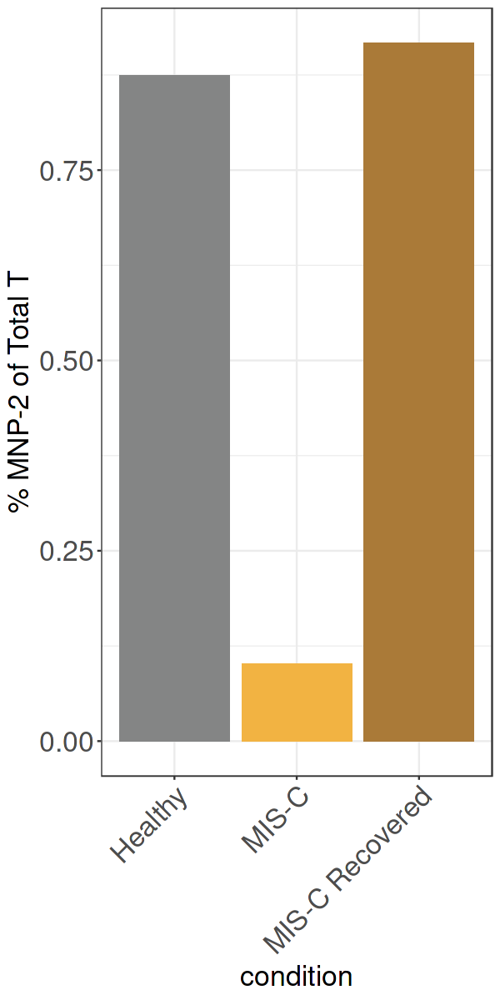

In [5]:
options(repr.plot.width = 5, repr.plot.height = 10)
ggplot(perc_mnp2, aes(x = condition, y = mnp2_perc, fill = condition)) + geom_bar(stat='identity') + 
scale_fill_manual(values = c('#848585','#F2B342','#AA7A38')) + 
theme_bw() + ylab('% MNP-2 of Total T') +
theme(axis.text.x = element_text(size = 20, angle = 45, hjust = 1, vjust = 1),
                                 axis.text.y = element_text(size = 20),
                                 axis.title = element_text(size = 20),
                                 legend.position = 'none')

In [6]:
# Open a pdf file
pdf("plots/misc_mnp2_prop.pdf", width = 5, height = 10) 
# 2. Create a plot
ggplot(perc_mnp2, aes(x = condition, y = mnp2_perc, fill = condition)) + geom_bar(stat='identity') + 
scale_fill_manual(values = c('#848585','#F2B342','#AA7A38')) + 
theme_bw() + ylab('% MNP-2 of Total T') +
theme(axis.text.x = element_text(size = 20, angle = 45, hjust = 1, vjust = 1),
                                 axis.text.y = element_text(size = 20),
                                 axis.title = element_text(size = 20),
                                 legend.position = 'none')
# Close the pdf file
dev.off() 

png 
  2

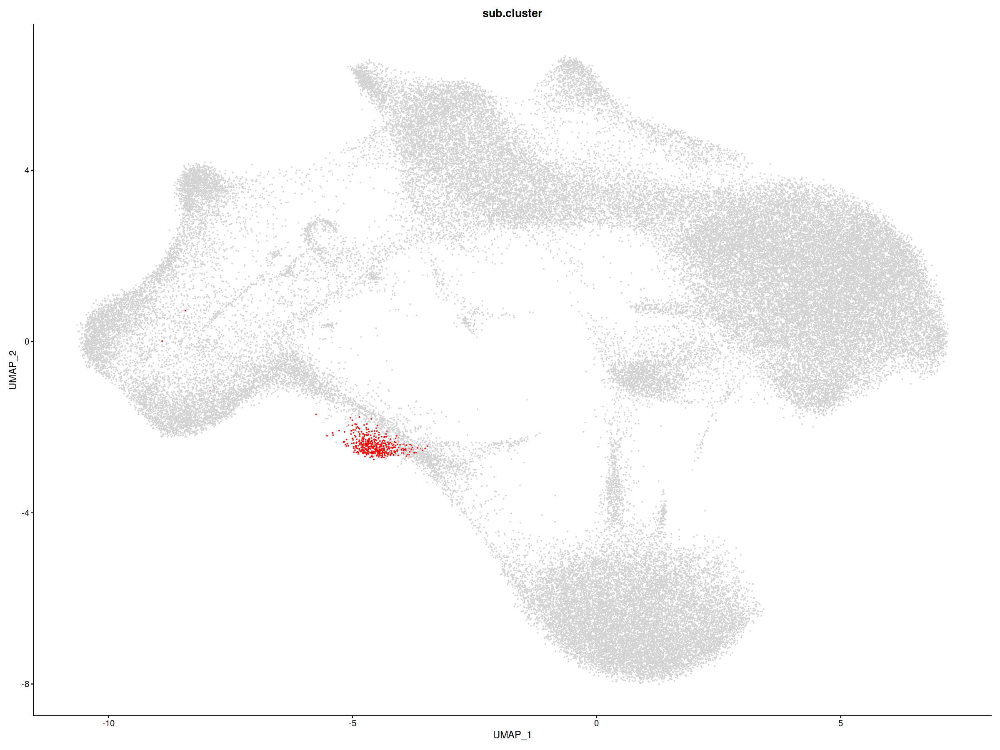

In [28]:
options(repr.plot.width = 20, repr.plot.height = 15)
DimPlot(t_cells, reduction = "umap", group.by = "sub.cluster", label = FALSE, 
        cols = c('lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey',
                'lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','red','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey')) & NoLegend()

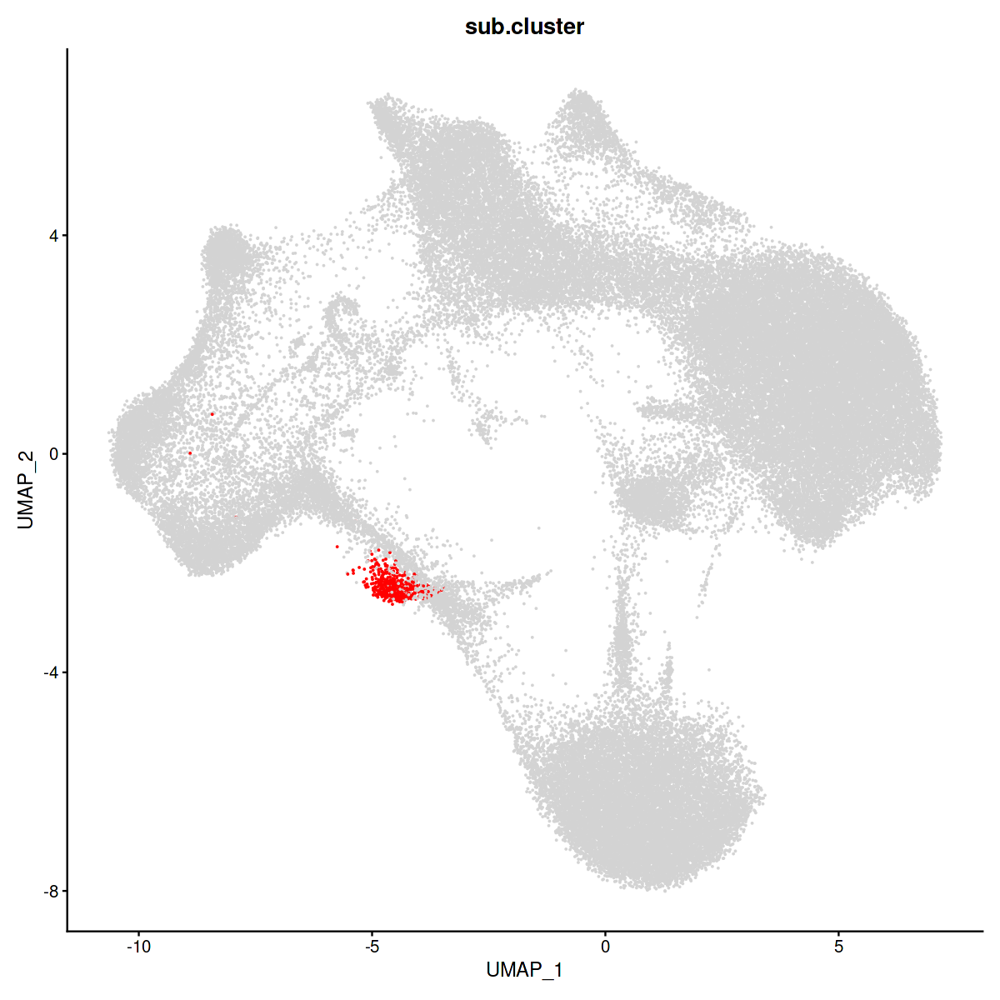

In [35]:
options(repr.plot.width = 10, repr.plot.height = 10)
DimPlot(t_cells, reduction = "umap", group.by = "sub.cluster", label = FALSE, 
        cols = c('lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey',
                'lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','red','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey')) & NoLegend()

In [37]:
# Open a pdf file
pdf("plots/misc_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
DimPlot(t_cells, reduction = "umap", group.by = "sub.cluster", label = FALSE, 
        cols = c('lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey',
                'lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey','red','lightgrey','lightgrey','lightgrey','lightgrey','lightgrey')) & NoLegend()
# Close the pdf file
dev.off()

png 
  2

In [38]:
saveRDS(t_cells, 'mis-c_integrated_t_cells.rds')

In [2]:
t_cells <- readRDS('mis-c_integrated_t_cells.rds')